In [44]:
import numpy as np
import matplotlib.pyplot as plt

In [45]:
def std(P):
    x=P
    for i in range(100):
        x=x@P
    return x[0]


In [46]:
K=5
s=2
P=np.zeros((K,s,s),dtype=np.float32)
for i in range(K):
  P[i][0][0]=np.random.uniform(0,1)
  P[i][0][1]=1-P[i][0][0]
  P[i][1][0]=np.random.uniform(0,1)
  P[i][1][1]=1-P[i][1][0]


pi=np.zeros((K,2))
for i in range(K):
  pi[i]=std(P[i])

print(pi)

mu_r=np.zeros((K,2))
for i in range(K):
#   mu_r[i][0]=np.random.randint(15,20)
#   mu_r[i][1]=np.random.randint(15,20)
  mu_r[i][0]=np.random.random()
  mu_r[i][1]=np.random.random()




print(mu_r)


mu=np.zeros((K,1))
for i in range(K):
  mu[i]=pi[i]@(mu_r[i].T)

print(mu)

mu_op=np.max(mu)
print(mu_op)

state=np.zeros(K,dtype=np.int32)
T=np.zeros(K)
total_r=np.zeros(K)
L=15
g=np.zeros(K)
N=10000
regret=np.zeros(N)

[[0.85002124 0.14997876]
 [0.50348026 0.49651939]
 [0.12250009 0.87749988]
 [0.76932794 0.23067193]
 [0.80266833 0.1973317 ]]
[[0.37121096 0.73182545]
 [0.13307849 0.00473505]
 [0.25910618 0.24870399]
 [0.70875182 0.36454103]
 [0.10251928 0.44050698]]
[[0.42529548]
 [0.06935343]
 [0.24997826]
 [0.62935195]
 [0.16921497]]
0.6293519541645332


In [47]:
def play(arm,state,mu_r,total_r,T,P):
    # s=state[arm]
    # print(s)
    mu=mu_r[arm][state[arm]]
    # print(mu)
    # reward=np.random.poisson(lam=mu,size=1)
    reward=np.random.binomial(1,mu_r[i][state[i]])    
    T[arm]+=1
    total_r[arm]+=reward
    s=np.random.uniform(0,1)
    p=P[arm][state[arm]][state[arm]]
    if s>p:
        state[arm]=1-state[arm]
    return reward
   
    



In [48]:
for i in range(K):
    arm=i
    # reward=np.random.poisson(lam=mu_r[arm][state[arm]],size=1)
    reward=np.random.binomial(1,mu_r[i][state[i]])
    T[arm]+=1
    total_r[arm]+=reward
    s=np.random.uniform(0,1)
    p=P[arm][state[arm]][state[arm]]
    if s>p:
        state[arm]=1-state[arm]
    g[i]=total_r[i]/T[i]

for i in range(N):
    arm=np.argmax(g)
    # reward=play(arm,state,mu_r,total_r,T,P)

    # mu=mu_r[arm][state[arm]]
    # print(mu)
    # reward=np.random.poisson(lam=mu_r[arm][state[arm]],size=1)
    reward=np.random.binomial(1,mu_r[arm][state[arm]])
    T[arm]+=1
    total_r[arm]+=reward
    s=np.random.uniform(0,1)
    p=P[arm][state[arm]][state[arm]]
    if s>p:
        state[arm]=1-state[arm]


    g=total_r/T+np.sqrt(L*np.log(i+1)/(T+1))
    if i==0:
      regret[i]=mu_op-mu[arm]
    else:
      regret[i]=regret[i-1]+mu_op-mu[arm]
    


In [49]:
m=np.array([[0.9,0.1],[0.3,0.7]])
n=std(m)

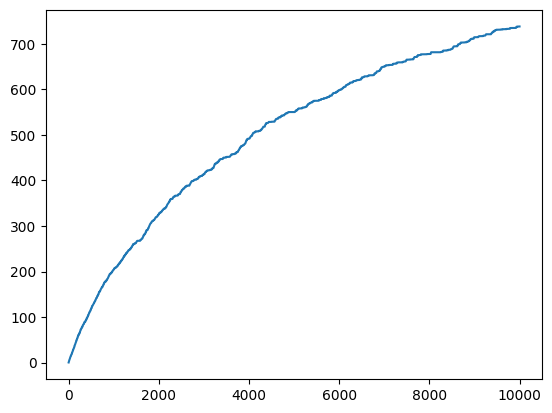

In [50]:
plt.plot(regret)


#KL-UCB

In [51]:
K=5
s=2
T_prev=[]
P=np.zeros((K,s,s),dtype=np.float32)
for i in range(K):
  P[i][0][0]=np.random.uniform(0,1)
  P[i][0][1]=1-P[i][0][0]
  P[i][1][0]=np.random.uniform(0,1)
  P[i][1][1]=1-P[i][1][0]


pi=np.zeros((K,2))
for i in range(K):
  pi[i]=std(P[i])

print(pi)

mu_r=np.zeros((K,2))
for i in range(K):
  mu_r[i][0]=np.random.random()
  mu_r[i][1]=np.random.random()

print(mu_r)


mu=np.zeros((K,1))
for i in range(K):
  mu[i]=pi[i]@(mu_r[i].T)

print(mu)

mu_op=np.max(mu)
print(mu_op)

state=np.zeros(K,dtype=np.int32)
T=np.zeros(K)
total_r=np.zeros(K)
L=15
total_r_exp=np.zeros(K)
N=10000
regret=np.zeros(N)
index=np.zeros(K)

[[0.65144056 0.34855944]
 [0.60588419 0.39411587]
 [0.83701003 0.16298988]
 [0.0673389  0.93266118]
 [0.83441025 0.16558976]]
[[0.80714276 0.19235311]
 [0.75466712 0.41255764]
 [0.69292175 0.40541929]
 [0.84933619 0.76650815]
 [0.66202431 0.97096059]]
[[0.59285203]
 [0.61983639]
 [0.6460617 ]
 [0.77208576]
 [0.71318101]]
0.7720857579796159


In [52]:
np.random.binomial(1,0.1)

0

In [53]:
# prob = [np.random.random(2) for i in range(K)]
for i in range(K):
    arm=i
    reward=np.random.binomial(1,mu_r[i][state[i]])
    T[arm]+=1
    total_r[arm]+=reward
    s=np.random.uniform(0,1)
    p=P[arm][state[arm]][state[arm]]
    if s>p:
        state[arm]=1-state[arm]
    # total_r_exp[i]=total_r[i]/T[i]


In [54]:
def play(arm,state,mu_r,total_r,T,P):
    mu=mu_r[arm][state[arm]]
    reward=np.random.binomial(1,mu_r[arm][state[arm]])
    T[arm]+=1
    total_r[arm]+=reward
    s=np.random.uniform(0,1)
    p=P[arm][state[arm]][state[arm]]
    if s>p:
        state[arm]=1-state[arm]
    return reward

In [55]:
def kl_divergence(p,q):
    
    return p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))

In [56]:
def kl_bound(t,T,arm):
    return (np.log(1 + t*(np.log(t)**2)))/T[arm]

In [58]:
for t in range(1,N):
    temp_arm_rewards=np.zeros(K)
    for arm in range(K):
        # temp_rewards=[]
        exp_r=1
        print(index)
        while exp_r>=(total_r[arm]/T[arm]):
            print("t=",t,"arm=",arm,"exp_r=", exp_r)
            v1 = kl_divergence(total_r[arm]/T[arm]+10**-5,exp_r)
            v2 = kl_bound(t,T,arm)
            print(v1,v2)
            if v1<=v2:
                index[arm]=exp_r
                print(index)
                break
            exp_r-=0.1
        print("\n")
      
    selected_arm = np.argmax(index)
    # play(selected_arm,state,mu_r,total_r,T,P)
    reward=np.random.binomial(1,mu_r[selected_arm][state[selected_arm]])
    T[selected_arm]+=1
    total_r[selected_arm]+=reward
    s=np.random.uniform(0,1)
    p=P[selected_arm][state[selected_arm]][state[selected_arm]]
    if s>p:
        state[selected_arm]=1-state[selected_arm]

    if t==0:
      regret[t]=mu_op-mu[selected_arm]
    else:
      regret[t]=regret[t-1]+mu_op-mu[selected_arm]

[0.7 0.7 0.  0.8 0. ]
t= 1 arm= 0 exp_r= 1
inf 0.0
t= 1 arm= 0 exp_r= 0.9
0.3715039985629716 0.0
t= 1 arm= 0 exp_r= 0.8
0.13862261759013159 0.0
t= 1 arm= 0 exp_r= 0.7000000000000001
0.03907983229525641 0.0
t= 1 arm= 0 exp_r= 0.6000000000000001
0.002172118653696098 0.0


[0.7 0.7 0.  0.8 0. ]
t= 1 arm= 1 exp_r= 1
inf 0.0
t= 1 arm= 1 exp_r= 0.9
0.3009533840328794 0.0
t= 1 arm= 1 exp_r= 0.8
0.09905088605998755 0.0
t= 1 arm= 1 exp_r= 0.7000000000000001
0.020098663552977486 0.0


[0.7 0.7 0.  0.8 0. ]
t= 1 arm= 2 exp_r= 1
nan 0.0


[0.7 0.7 0.  0.8 0. ]
t= 1 arm= 3 exp_r= 1
inf 0.0
t= 1 arm= 3 exp_r= 0.9
0.07780151618516268 0.0
t= 1 arm= 3 exp_r= 0.8
0.003950509390177548 0.0


[0.7 0.7 0.  0.8 0. ]
t= 1 arm= 4 exp_r= 1
nan 0.0


[0.7 0.7 0.  0.8 0. ]
t= 2 arm= 0 exp_r= 1
inf 0.009100089534240647
t= 2 arm= 0 exp_r= 0.9
0.3715039985629716 0.009100089534240647
t= 2 arm= 0 exp_r= 0.8
0.13862261759013159 0.009100089534240647
t= 2 arm= 0 exp_r= 0.7000000000000001
0.03907983229525641 0.00910008953

C:\Users\Dell\AppData\Local\Temp\ipykernel_10756\1661826245.py:3: RuntimeWarning: divide by zero encountered in scalar divide
  return p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
C:\Users\Dell\AppData\Local\Temp\ipykernel_10756\1661826245.py:3: RuntimeWarning: invalid value encountered in log
  return p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))


[0.7 0.7 0.  0.8 0. ]


[0.7 0.7 0.  0.8 0. ]
t= 36 arm= 4 exp_r= 1
nan 6.138370232433466


[0.7 0.7 0.  0.8 0. ]
t= 37 arm= 0 exp_r= 1
inf 0.08352584612367459
t= 37 arm= 0 exp_r= 0.9
0.3715039985629716 0.08352584612367459
t= 37 arm= 0 exp_r= 0.8
0.13862261759013159 0.08352584612367459
t= 37 arm= 0 exp_r= 0.7000000000000001
0.03907983229525641 0.08352584612367459
[0.7 0.7 0.  0.8 0. ]


[0.7 0.7 0.  0.8 0. ]
t= 37 arm= 1 exp_r= 1
inf 0.05943185204953769
t= 37 arm= 1 exp_r= 0.9
0.3009533840328794 0.05943185204953769
t= 37 arm= 1 exp_r= 0.8
0.09905088605998755 0.05943185204953769
t= 37 arm= 1 exp_r= 0.7000000000000001
0.020098663552977486 0.05943185204953769
[0.7 0.7 0.  0.8 0. ]


[0.7 0.7 0.  0.8 0. ]
t= 37 arm= 2 exp_r= 1
nan 6.18091261315192


[0.7 0.7 0.  0.8 0. ]
t= 37 arm= 3 exp_r= 1
inf 0.012537348099699634
t= 37 arm= 3 exp_r= 0.9
0.0746952796137014 0.012537348099699634
t= 37 arm= 3 exp_r= 0.8
0.0033242037509938274 0.012537348099699634
[0.7 0.7 0.  0.8 0. ]


[0.7 0.7 0.  0.8 0. 

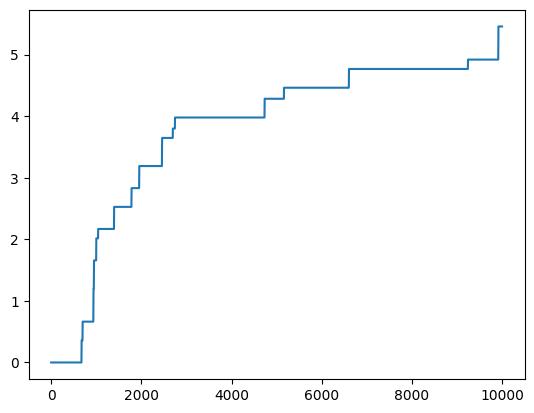

In [59]:
plt.plot(regret)

In [ ]:
plt.plot(regret)